In [ ]:
!pip install keras_applications

     |████████████████████████████████| 51kB 4.6MB/s 


In [ ]:
!pip install git+https://github.com/rcmalli/keras-vggface.git

  Cloning https://github.com/rcmalli/keras-vggface.git to /tmp/pip-req-build-k6gcn9a8
  Running command git clone -q https://github.com/rcmalli/keras-vggface.git /tmp/pip-req-build-k6gcn9a8
  Created wheel for keras-vggface: filename=keras_vggface-0.6-cp36-none-any.whl size=8310 sha256=ef63163209697dfa981ed75c741067ca7b2284e7e0fda4ee804369fc8d348142
  Stored in directory: /tmp/pip-ephem-wheel-cache-dxbpzwfz/wheels/36/07/46/06c25ce8e9cd396dabe151ea1d8a2bc28dafcb11321c1f3a6d
Successfully built keras-vggface


In [ ]:
############################################# Proposed Siamese One-shot Face Learner ######################### 

# imports for face verification with the VGGFace2 model->
from matplotlib import pyplot
from PIL import Image
from numpy import asarray
from scipy.spatial.distance import cosine
#from mtcnn.mtcnn import MTCNN
from keras_vggface.vggface import VGGFace
from keras_vggface.utils import preprocess_input
from keras_vggface.utils import decode_predictions

#imports for our Siamese NN model
import torchvision
import torchvision.datasets as dset
import torchvision.transforms as transforms
from torch.utils.data import DataLoader,Dataset
import matplotlib.pyplot as plt
import torchvision.utils
import numpy as np
import random
from PIL import Image
import torch
from torch.autograd import Variable
import PIL.ImageOps    
import torch.nn as nn
from torch import optim
import torch.nn.functional as F

from scipy.spatial.distance import cosine
import os
import glob
import pyunpack

In [ ]:
!pip install pyunpack

In [ ]:
!pip install patool

     |████████████████████████████████| 81kB 5.8MB/s 


In [ ]:
c= os.listdir('./data_half')
c.remove('./ipynb_checkpoints')

ValueError: ignored

In [ ]:
random.seed(456)

In [ ]:
for i in c:
  path = './data_half/'+ i
  if not os.path.exists('./imagebank_half/'+ i):
    os.makedirs('./imagebank_half/'+i)
  imgs = os.listdir(path)  
  for j in range(30):
    d=random.choice(imgs)
    img0 = Image.open(path+'/'+d)
    img0.save('./imagebank_half/'+ i+'/' +d)



In [ ]:
c= os.listdir('./drive/MyDrive/celeb data')

In [ ]:
for i in c:
    if not os.path.exists('./data_crop/'+ i.split(".")[0]):
        os.makedirs('./data_crop/'+ i.split(".")[0])
    path = './drive/MyDrive/celeb data/'+ i
    arch = pyunpack.Archive(path)
    # os.mkdir(name)
    print(path)
    path1 = './data_crop/' + i.split(".")[0]
    arch.extractall(directory=path1)
    print(path1)

./drive/MyDrive/celeb data/emma roberts.rar
./data_crop/emma roberts
./drive/MyDrive/celeb data/emma watson.rar
./data_crop/emma watson
./drive/MyDrive/celeb data/ethan hawke.rar
./data_crop/ethan hawke
./drive/MyDrive/celeb data/eric bana.rar
./data_crop/eric bana
./drive/MyDrive/celeb data/emma stone.rar
./data_crop/emma stone
./drive/MyDrive/celeb data/chris martin.rar
./data_crop/chris martin
./drive/MyDrive/celeb data/cameron diaz.rar
./data_crop/cameron diaz
./drive/MyDrive/celeb data/chris hemsworth.rar
./data_crop/chris hemsworth
./drive/MyDrive/celeb data/cate blanchett.rar
./data_crop/cate blanchett
./drive/MyDrive/celeb data/casey affleck.rar
./data_crop/casey affleck
./drive/MyDrive/celeb data/bruno mars.rar
./data_crop/bruno mars
./drive/MyDrive/celeb data/bruce lee.rar
./data_crop/bruce lee
./drive/MyDrive/celeb data/brie larson.rar
./data_crop/brie larson
./drive/MyDrive/celeb data/brittany snow.rar
./data_crop/brittany snow
./drive/MyDrive/celeb data/britney spears.rar


In [ ]:
!unzip './imagebank_half.zip' -d './'

In [ ]:
#Helper function to show plot
def show_plot(iteration,loss):
    plt.plot(iteration,loss)
    plt.show()

In [ ]:
#Helper function to draw image
def imshow(img,text=None,should_save=False):
    npimg = img.numpy()
    plt.axis("off")
    if text:
        plt.text(75, 8, text, style='italic',fontweight='bold',
            bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show() 

In [ ]:
#VGG model loading
model = VGGFace(model='resnet50', include_top=False, input_shape=(224, 224, 3), pooling='max')

94699520/94694792 [==============================] - 1s 0us/step


In [ ]:
# extract the face from an image not reqd if extracted face BB data uploaded manually
def extract_face(filename, required_size=(100, 100)):
    # load image from file
    pixels = pyplot.imread(filename)
    # create the detector, using default weights
    detector = MTCNN()
    # detect faces in the image
    results = detector.detect_faces(pixels)
    if(len(results) > 1):
        raise ValueError('A very specific bad thing happened.');# extract the bounding box from the first face
    x1, y1, width, height = results[0]['box']
    #cutting the bottom half of the image
    x2, y2 = x1 + width, int(y1 + height/1.7)
    # extract the face
    face = pixels[y1:y2, x1:x2]
    # resize pixels to the model size
    image = Image.fromarray(face)
    image = image.resize(required_size)
    face_array = asarray(image)
    return face_array

In [ ]:
random.seed(10)

In [ ]:
class SiameseNetworkDataset(Dataset):
    
    def __init__(self,imageFolderDataset,transform=None,should_invert=True):
        self.imageFolderDataset = imageFolderDataset    
        self.transform = transform
        self.should_invert = should_invert
        
    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)
        #we need to make sure approx 50% of images are in the same class
        should_get_same_class = random.randint(0,1) 
        if should_get_same_class:
            while True:
                #keep looping till the same class image is found
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1]==img1_tuple[1]:
                    break
        else:
            while True:
                #keep looping till a different class image is found
                
                img1_tuple = random.choice(self.imageFolderDataset.imgs) 
                if img0_tuple[1] !=img1_tuple[1]:
                    break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img1_tuple[0])
        img2 = Image.open(img0_tuple[0])
        img3 = Image.open(img1_tuple[0])
        img0 = img0.resize((100,100))
        img1 = img1.resize((100,100))
        #img2 = img2.resize((224,224))
        #img3 = img3.resize((224,224))
        img0 = img0.convert("L")
        img1 = img1.convert("L")
        
        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)
            img2 = PIL.ImageOps.invert(img2)
            img3 = PIL.ImageOps.invert(img3)
            print(img3.size)
        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)
            img2 = self.transform(img2)
            img3 = self.transform(img3)

        return img0, img1 , img2,img3,torch.from_numpy(np.array([int(img1_tuple[1]!=img0_tuple[1])],dtype=np.float32))
    
    def __len__(self):
        return len(self.imageFolderDataset.imgs)



In [ ]:
class SiameseNetworkDatasetLoader(Dataset):
    
    def __init__(self,imageFolderDataset,transform=None,should_invert=True):
        self.imageFolderDataset = imageFolderDataset    
        self.transform = transform
        self.should_invert = should_invert
        
    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)
        #we need to make sure approx 50% of images are in the same class
        should_get_same_class = random.randint(0,1) 
        if should_get_same_class:
            while True:
                #keep looping till the same class image is found
                img1_tuple = random.choice(self.imageFolderDataset.imgs)
                if img0_tuple[1]==img1_tuple[1]:
                    break
        else:
            while True:
                #keep looping till a different class image is found
                
                img1_tuple = random.choice(self.imageFolderDataset.imgs) 
                if img0_tuple[1] !=img1_tuple[1]:
                    break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img1_tuple[0])
        img0 = img0.resize((100,100))
        img1 = img1.resize((100,100))
        img0 = img0.convert("L")
        img1 = img1.convert("L")
        
        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)
        
        return img0, img1 , torch.from_numpy(np.array([int(img1_tuple[1]!=img0_tuple[1])],dtype=np.float32))
    
    def __len__(self):
        return len(self.imageFolderDataset.imgs)



In [ ]:
class SiameseNetworkDatasetLoadermass(Dataset):
    
    def __init__(self,imageFolderDataset,transform=None,should_invert=True):
        self.imageFolderDataset = imageFolderDataset    
        self.transform = transform
        self.should_invert = should_invert
        
    def __getitem__(self,index):
        img0_tuple = random.choice(self.imageFolderDataset.imgs)
        #we need to make sure approx 50% of images are in the same class
        #should_get_same_class = random.randint(0,1) 
        #if should_get_same_class:
        #    while True:
                #keep looping till the same class image is found
        img1_tuple = random.choice(self.imageFolderDataset.imgs)
        #        if img0_tuple[1]==img1_tuple[1]:
        #            break
        #else:
        #    while True:
        #        #keep looping till a different class image is found
        #        
        #        img1_tuple = random.choice(self.imageFolderDataset.imgs) 
        #        if img0_tuple[1] !=img1_tuple[1]:
        #            break

        img0 = Image.open(img0_tuple[0])
        img1 = Image.open(img0_tuple[0])
        img0 = img0.resize((100,100))
        #img1 = img1.resize((100,100))
        img0 = img0.convert("L")
        #img1 = img1.convert("L")
        
        if self.should_invert:
            img0 = PIL.ImageOps.invert(img0)
            img1 = PIL.ImageOps.invert(img1)

        if self.transform is not None:
            img0 = self.transform(img0)
            img1 = self.transform(img1)
        
        return img0, img1 ,img0_tuple[1]
    
    def __len__(self):
        return len(self.imageFolderDataset.imgs)



In [ ]:
#Creating folder dataset 
folder_dataset = dset.ImageFolder(root = "./imagebank_half")
siamese_dataset = SiameseNetworkDatasetLoadermass(imageFolderDataset=folder_dataset,
                                        transform=transforms.Compose([
                                                                      transforms.ToTensor(),
                                                                      ])
                                       ,should_invert=False)

In [ ]:
class SiameseNetwork(nn.Module):
    def __init__(self):
        super(SiameseNetwork, self).__init__()
        self.cnn1 = nn.Sequential(
            nn.ReflectionPad2d(1),
            nn.Conv2d(1, 4, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(4),
            
            nn.ReflectionPad2d(1),
            nn.Conv2d(4, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


            nn.ReflectionPad2d(1),
            nn.Conv2d(8, 8, kernel_size=3),
            nn.ReLU(inplace=True),
            nn.BatchNorm2d(8),


        )

        self.fc1 = nn.Sequential(
            nn.Linear(8*100*100, 512),
            nn.ReLU(inplace=True),

            nn.Linear(512, 512),
            nn.ReLU(inplace=True),

            nn.Linear(512, 256))

    def forward_once(self, x):
        output = self.cnn1(x)
        output = output.view(output.size()[0], -1)
        output = self.fc1(output)
        return output

    def forward(self, input1, input2):
        output1 = self.forward_once(input1)
        output2 = self.forward_once(input2)
        return output1, output2

In [ ]:
class ContrastiveLoss(torch.nn.Module):

    """
    Contrastive loss function.
    Based on: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf
    """

    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin

    def forward(self, output1, output2, label):
        euclidean_distance = F.pairwise_distance(output1, output2, keepdim = True)
        loss_contrastive = torch.mean((1-label) * torch.pow(euclidean_distance, 2) +
                                      (label) * torch.pow(torch.clamp(self.margin - euclidean_distance, min=0.0), 2))

        return loss_contrastive

In [ ]:
#Declare train loader 
train_dataloader = DataLoader(siamese_dataset,
                        shuffle=True,
                        num_workers=0,
                        batch_size=1)

dataiter = iter(train_dataloader)
example_batch = next(dataiter)
print(example_batch[1].shape)
concatenated = torch.cat((example_batch[1],example_batch[1]),0)
imshow(torchvision.utils.make_grid(concatenated))
#print(example_batch[2].shape)
img0 = np.transpose(example_batch[1], (0,2, 3, 1))
print(img0.shape)
#img1 = torch.as_tensor(np.expand_dims(np.array(img1).astype('float'), axis=0))
samples1 = preprocess_input(img0, version=2)
#samples2 = preprocess_input(img1, version=2)
#yhat1 = cosine(model.predict(samples1), model.predict(samples2))
model.predict(samples1)

In [ ]:
# model defination
net = SiameseNetwork()
criterion = ContrastiveLoss()
optimizer = optim.Adam(net.parameters(), lr=1e-3, weight_decay=0.0005)
if torch.cuda.is_available():
    net.cuda()

In [ ]:
from colored import fg, bg, attr
import time

counter = []
loss_history = [] 
iteration_number= 0
num_epoch = 1
interval = 1
best_loss = np.Inf
path = "./mask_siamese"+str(num_epoch)+".pth"

#model train
t1=time.time()
for epoch in range(0,num_epoch):
    for i, data in enumerate(train_dataloader,0):
        img0, img1 , label = data
        img0, img1 , label = img0.cuda(), img1.cuda(), label.cuda()
        optimizer.zero_grad()
        output1,output2 = net(img0,img1)
        loss_contrastive = criterion(output1,output2,label)
        loss_contrastive.backward()
        optimizer.step()            
        
    if (epoch+1)%interval == 0:
        #print("Epoch Number- {}: Current Loss- {:.4f}\n".format(epoch,loss_contrastive.item()))
        lss='{:.4f}'.format(loss_contrastive.item())
        print ('%s%s Epoch Number- %s: Current Loss- %s %s \n' % (fg(9), attr('bold'), str(epoch+1), str(lss), attr(0)))
        iteration_number +=interval
        counter.append(iteration_number)
        loss_history.append(loss_contrastive.item())
        if loss_contrastive.item()<best_loss:
            print ('%s%s Best Loss improved from %s to %s %s \n' % (fg('orchid'), attr('bold'), str(best_loss), str(loss_contrastive.item()), attr('reset')))
            best_loss = loss_contrastive.item()
            torch.save(net, path)

t2=time.time()
print("Total Training-time (mins.): {:.4f}".format((t2-t1)/60))
show_plot(counter,loss_history)

In [ ]:
def normalize(word_vec):
    norm=np.linalg.norm(word_vec)
    if norm == 0: 
       return word_vec
    return word_vec/norm

In [ ]:
# tester function to test n image
n = 2
#num_epoch=10
path = "./mask_siamese"+str(num_epoch)+".pth"
net = torch.load(path)

#creating seperate test dataser
folder_dataset_test = dset.ImageFolder("./data")
siamese_dataset = SiameseNetworkDatasetLoadermass(imageFolderDataset=folder_dataset_test,
                                        transform=transforms.Compose([
                                            transforms.ToTensor()
                                            ])
                                        ,should_invert=False)

test_dataloader = DataLoader(siamese_dataset,num_workers=0,batch_size=1,shuffle=True)
dataiter = iter(test_dataloader)

# function to resize image to vgg2 format
trans_vgg = transforms.Compose([transforms.Resize((224,224))])
tran1 = transforms.ToPILImage()

for i in range(n):
    bat = next(dataiter)
    concatenated = torch.cat((bat[0],bat[1]),0)
    
    output1,output2 = net(Variable(bat[0].cuda()),Variable(bat[1]).cuda())
    print("Dissimilar picture: {}".format(bat[2].detach().numpy()[0][0]))
    print("Cosine dissimilarity for our model: {:.4f}".format(cosine(output1.cpu().detach().numpy(),output2.cpu().detach().numpy())))
    # getting image vector from vgg2
    '''npimg1 = trans_vgg(tran1(bat[0][0])) # this works fine
    npimg1 = np.array(npimg1).reshape(1,224,224,3) 
    npimg2 = trans_vgg(tran1(bat[1][0])) # this works fine
    npimg2 = np.array(npimg2).reshape(1,224,224,3) 
        
    # convert into an array of samples
    npimg1 = asarray(npimg1, 'float32')
    npimg2 = asarray(npimg2, 'float32')
    
    samples1 = preprocess_input(npimg1, version=2)
    samples2 = preprocess_input(npimg2, version=2)
    yhat1 = model.predict(samples1)
    yhat2 = model.predict(samples2)
    print("Cosine dissimilarity for VGGFace2 model: {:.4f}".format(cosine(yhat1,yhat2)))'''
    imshow(torchvision.utils.make_grid(concatenated))

In [ ]:
transformss=transforms.Compose([transforms.ToTensor(), ])
img0 = Image.open('./imagebank_half/' + 'brad_pitt_crop/' + '12_align_cut.png' )
img1 = Image.open('./imagebank_half/' + 'blake lively crop/' + '232_align_cut.png' )
#img0 = img0.resize((224,224))
#img1 = img1.resize((224,224))
img0 =  transformss(img0)
img1 =  transformss(img1)

img0 = torch.as_tensor(np.expand_dims(np.array(img0).astype('float'), axis=0))
img0 = np.transpose(img0, (0,2, 3, 1))
img1 = torch.as_tensor(np.expand_dims(np.array(img1).astype('float'), axis=0))
img1 = np.transpose(img1, (0,2, 3, 1))

samples1 = preprocess_input(img0, version=2)
samples2 = preprocess_input(img1, version=2)
yhat1 = cosine(model.predict(samples1), model.predict(samples2))
#model.predict(samples1)
yhat1


5.8710575103759766e-05

In [ ]:
random.seed(455)
import time

/usr/local/lib/python3.6/dist-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.container.Sequential' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.padding.ReflectionPad2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.6/dist-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute

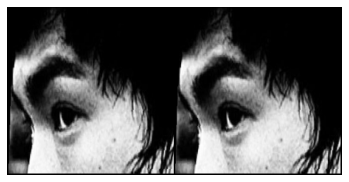

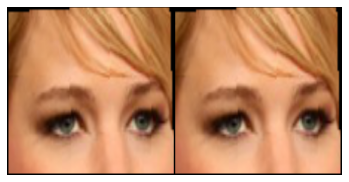

ours
tensor([13])
emma stone


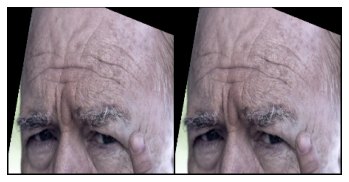

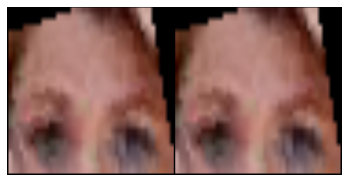

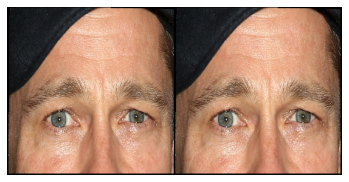

ours
tensor([1])
brad_pitt
ours
tensor([1])
chris hemsworth


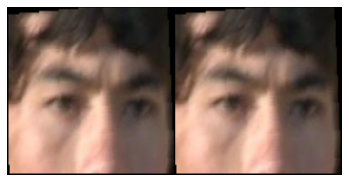

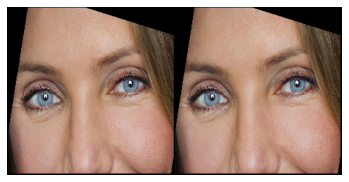

ours
tensor([9])
emma roberts
ours
tensor([9])
emma stone
ours
tensor([9])
blake lively


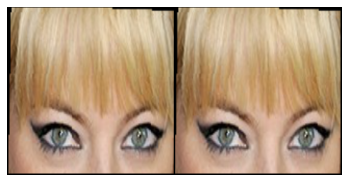

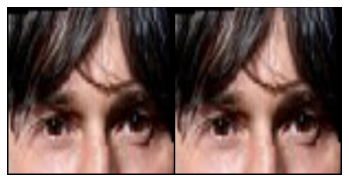

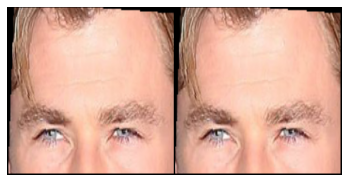

ours
tensor([12])
emma watson
ours
tensor([12])
brad_pitt
ours
tensor([12])
christian_bale
ours
tensor([12])
chris martin
ours
tensor([12])
brian cox
ours
tensor([12])
bruno mars
ours
tensor([12])
eric bana
ours
tensor([12])
chris hemsworth


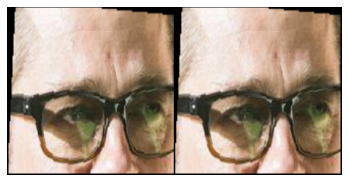

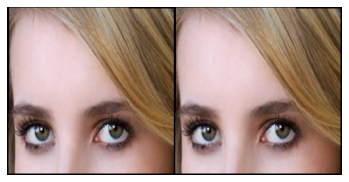

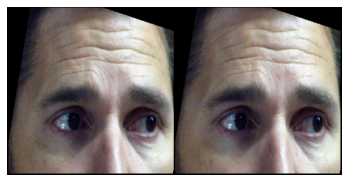

ours
tensor([18])
chris hemsworth


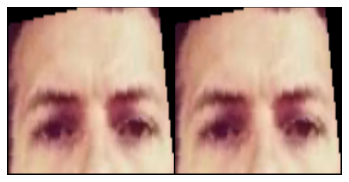

ours
tensor([13])
brad_pitt
ours
tensor([13])
britney spears
ours
tensor([13])
ethan hawke
ours
tensor([13])
brendan gleeson
ours
tensor([13])
brittany snow
ours
tensor([13])
blake lively
ours
tensor([13])
bruce lee
ours
tensor([13])
brian cox
ours
tensor([13])
chris hemsworth


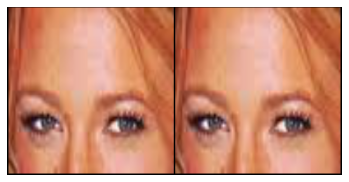

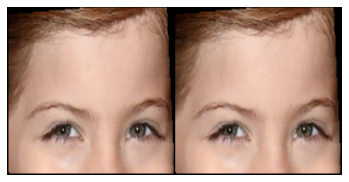

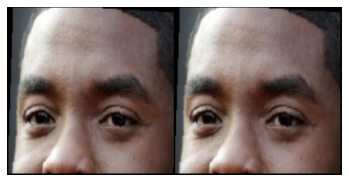

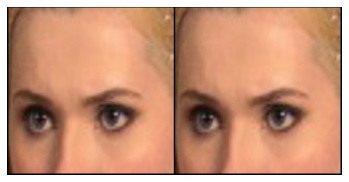

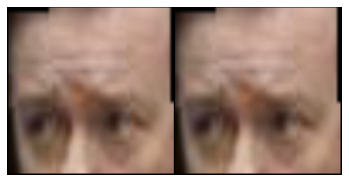

ours
tensor([18])
brad_pitt
ours
tensor([18])
ethan hawke
ours
tensor([18])
christian_bale
ours
tensor([18])
chris martin
ours
tensor([18])
bruce lee
ours
tensor([18])
chadwick_boseman
ours
tensor([18])
bruno mars
ours
tensor([18])
eric bana
ours
tensor([18])
chris hemsworth


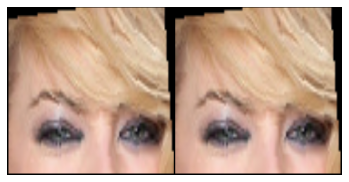

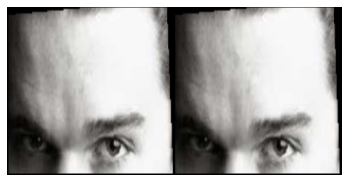

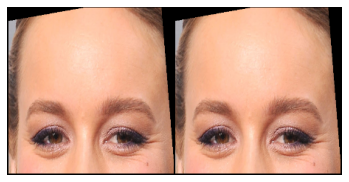

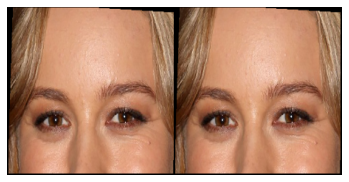

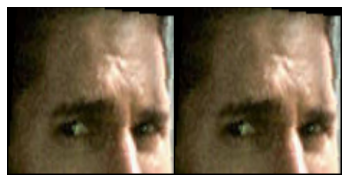

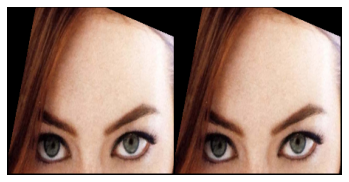

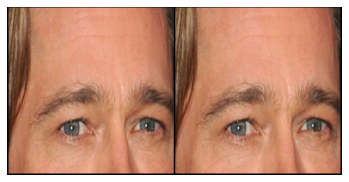

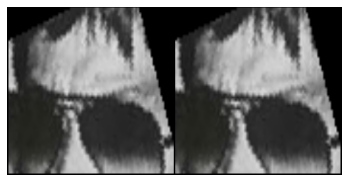

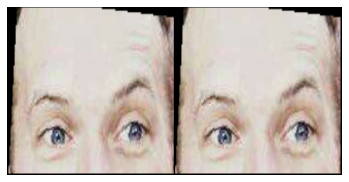

ours
tensor([13])
emma watson
ours
tensor([13])
britney spears
ours
tensor([13])
ethan hawke
ours
tensor([13])
brendan gleeson
ours
tensor([13])
brittany snow
ours
tensor([13])
blake lively
ours
tensor([13])
chris hemsworth


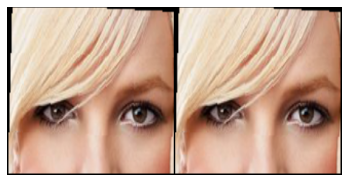

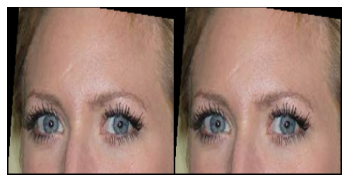

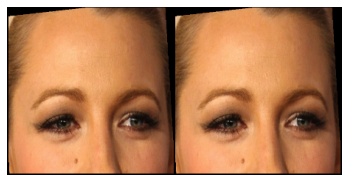

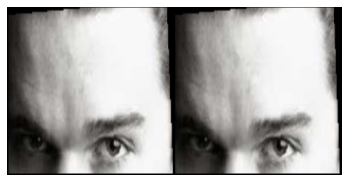

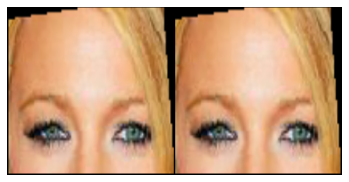

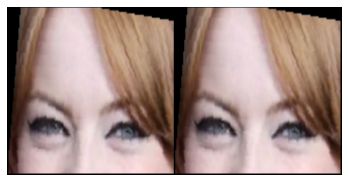

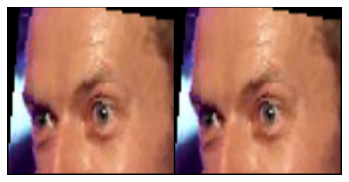

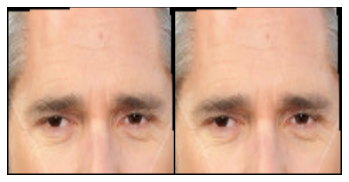

ours
tensor([18])
brad_pitt
ours
tensor([18])
christian_bale
ours
tensor([18])
chadwick_boseman
ours
tensor([18])
bruno mars
ours
tensor([18])
chris hemsworth


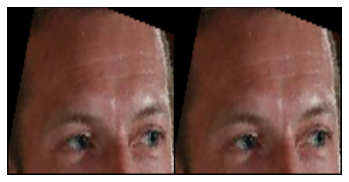

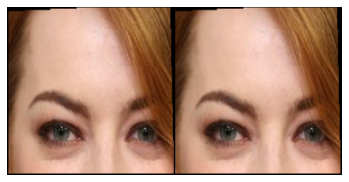

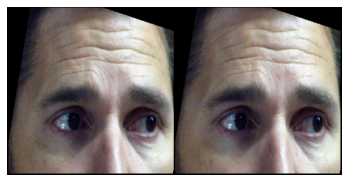

ours
tensor([18])
chris hemsworth


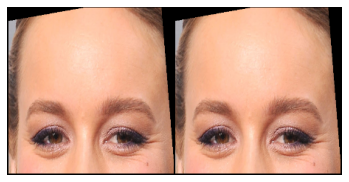

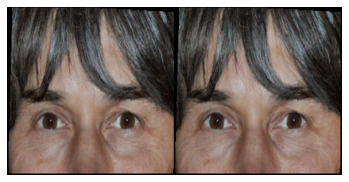

ours
tensor([3])
brad_pitt
ours
tensor([3])
britney spears
ours
tensor([3])
brendan gleeson
ours
tensor([3])
brittany snow
ours
tensor([3])
chris hemsworth


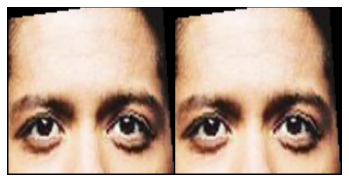

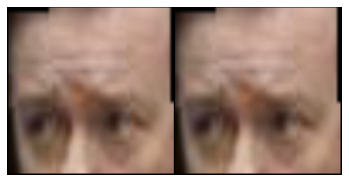

ours
tensor([18])
brad_pitt
ours
tensor([18])
ethan hawke
ours
tensor([18])
christian_bale
ours
tensor([18])
chris martin
ours
tensor([18])
bruce lee
ours
tensor([18])
chadwick_boseman
ours
tensor([18])
bruno mars
ours
tensor([18])
eric bana
ours
tensor([18])
chris hemsworth


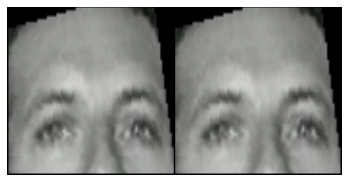

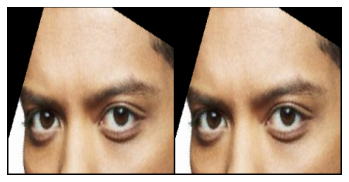

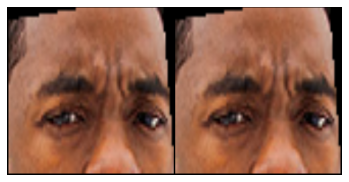

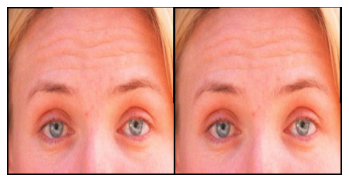

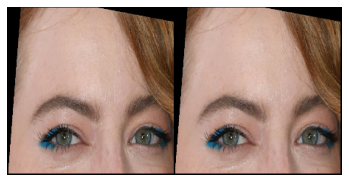

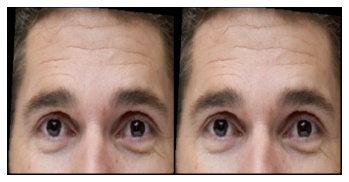

ours
tensor([18])
christian_bale


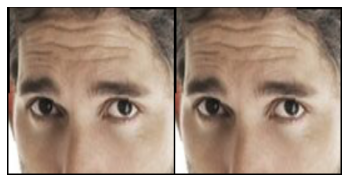

ours
tensor([18])
chris hemsworth


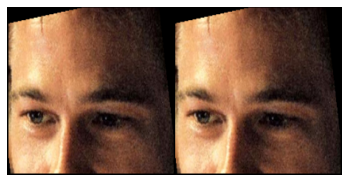

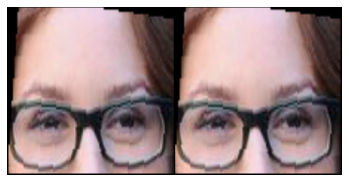

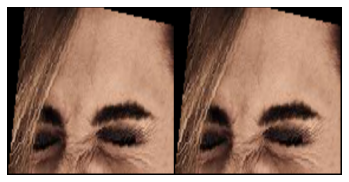

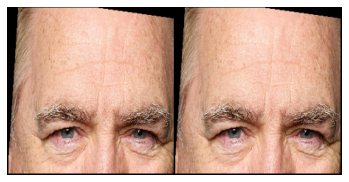

ours
tensor([3])
brad_pitt
ours
tensor([3])
brendan gleeson
ours
tensor([3])
brittany snow
ours
tensor([3])
chris hemsworth


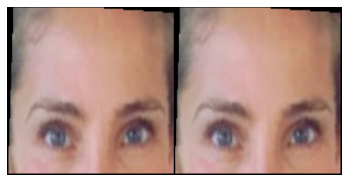

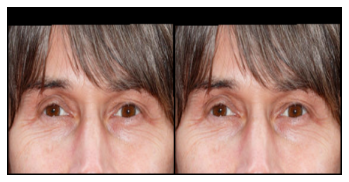

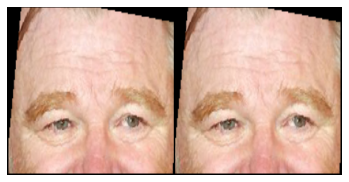

ours
tensor([2])
emma watson
ours
tensor([2])
britney spears
ours
tensor([2])
ethan hawke
ours
tensor([2])
brendan gleeson
ours
tensor([2])
brittany snow
ours
tensor([2])
blake lively
ours
tensor([2])
chris hemsworth


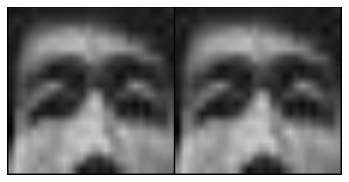

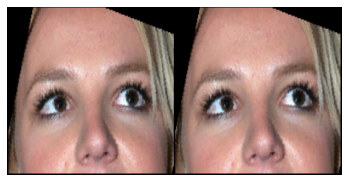

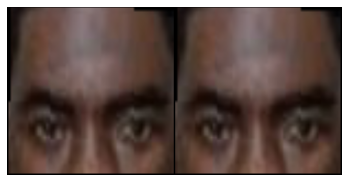

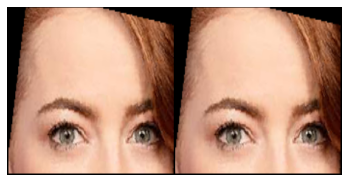

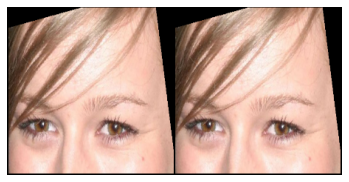

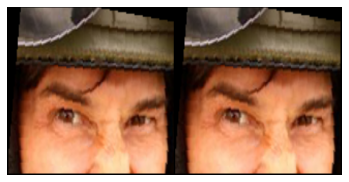

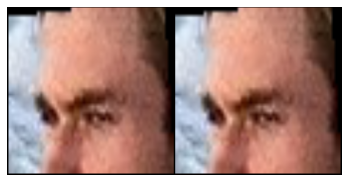

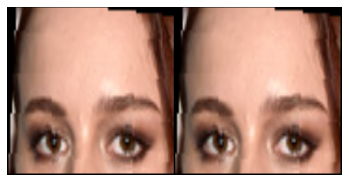

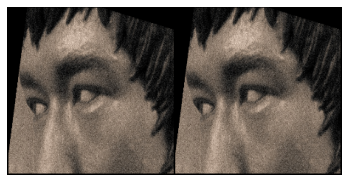

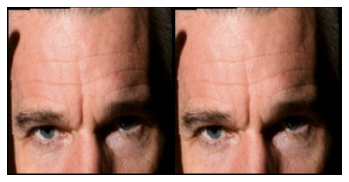

ours
tensor([19])
emma watson
ours
tensor([19])
brad_pitt
ours
tensor([19])
chris martin
ours
tensor([19])
brian cox
ours
tensor([19])
eric bana


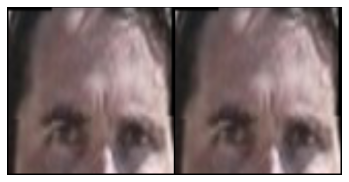

ours
tensor([14])
chris hemsworth


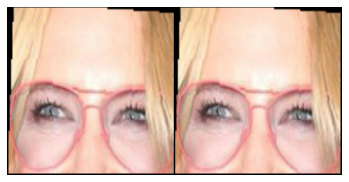

ours
tensor([10])
brittany snow
ours
tensor([10])
blake lively


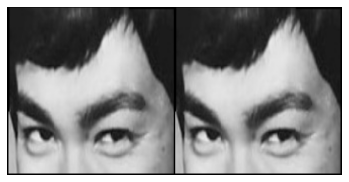

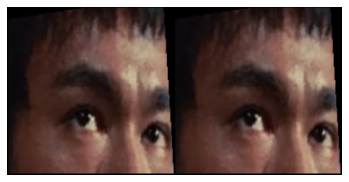

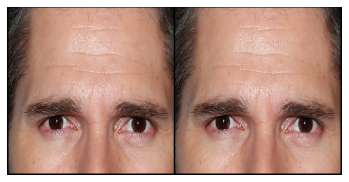

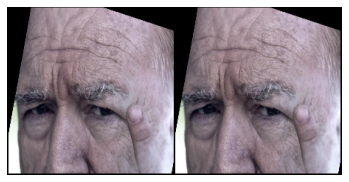

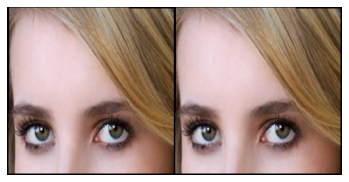

...

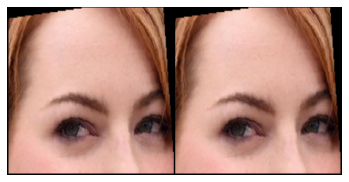

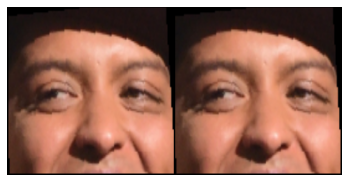

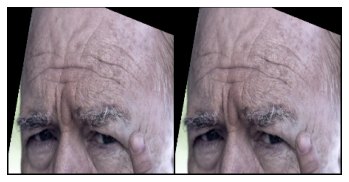

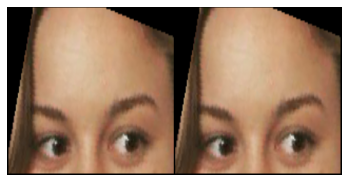

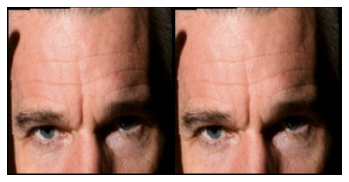

ours
tensor([19])
emma watson
ours
tensor([19])
brad_pitt
ours
tensor([19])
chris martin
ours
tensor([19])
brian cox
ours
tensor([19])
eric bana


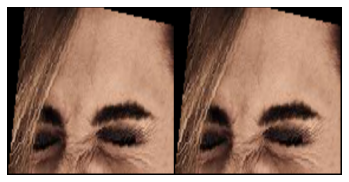

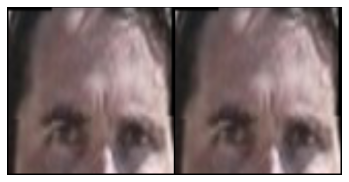

ours
tensor([14])
chris hemsworth


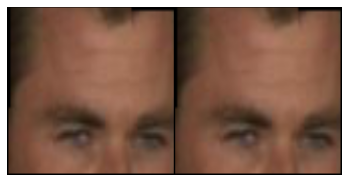

ours
tensor([12])
brad_pitt
ours
tensor([12])
ethan hawke
ours
tensor([12])
brendan gleeson
ours
tensor([12])
chris martin
ours
tensor([12])
bruce lee
ours
tensor([12])
chadwick_boseman
ours
tensor([12])
bruno mars
ours
tensor([12])
eric bana
ours
tensor([12])
chris hemsworth


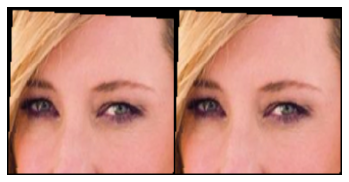

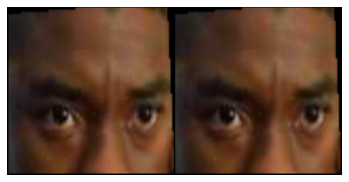

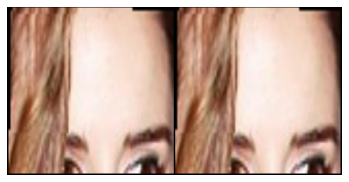

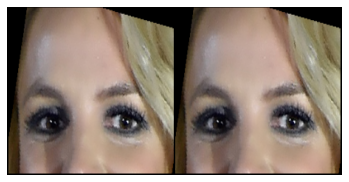

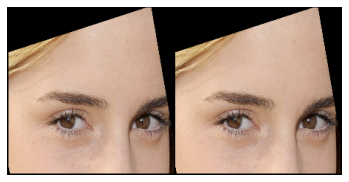

...

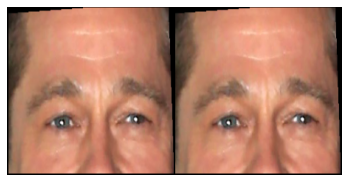

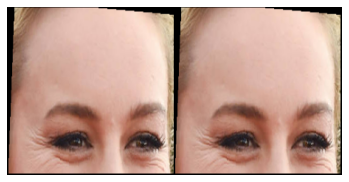

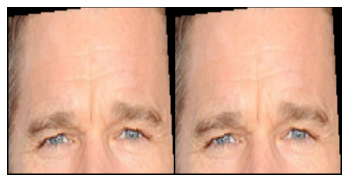

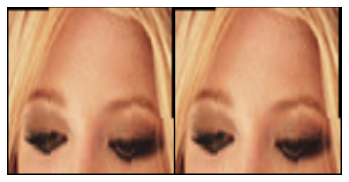

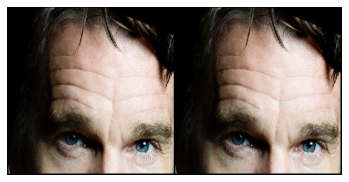

ours
tensor([19])
brad_pitt
ours
tensor([19])
britney spears
ours
tensor([19])
ethan hawke
ours
tensor([19])
brendan gleeson
ours
tensor([19])
bruce lee
ours
tensor([19])
chadwick_boseman
ours
tensor([19])
bruno mars
ours
tensor([19])
chris hemsworth


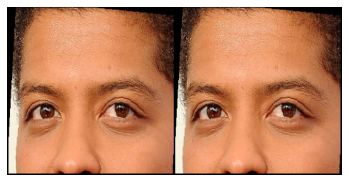

ours
tensor([8])
brad_pitt
ours
tensor([8])
britney spears
ours
tensor([8])
ethan hawke
ours
tensor([8])
christian_bale
ours
tensor([8])
bruce lee
ours
tensor([8])
chadwick_boseman
ours
tensor([8])
bruno mars
ours
tensor([8])
chris hemsworth


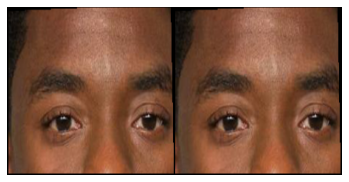

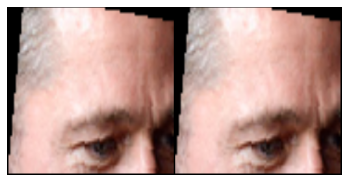

ours
tensor([1])
brad_pitt
ours
tensor([1])
britney spears
ours
tensor([1])
ethan hawke
ours
tensor([1])
christian_bale
ours
tensor([1])
brendan gleeson
ours
tensor([1])
brittany snow
ours
tensor([1])
bruce lee
ours
tensor([1])
chadwick_boseman
ours
tensor([1])
bruno mars
ours
tensor([1])
chris hemsworth


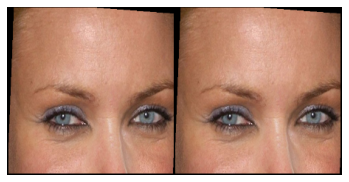

ours
tensor([9])
emma roberts
ours
tensor([9])
emma stone


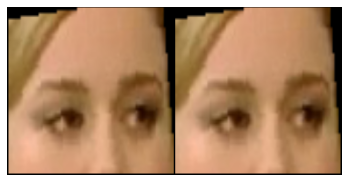

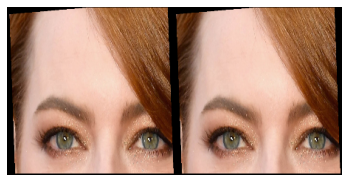

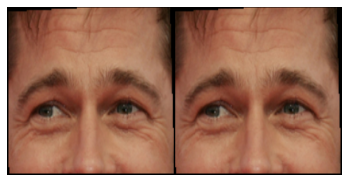

ours
tensor([1])
brad_pitt
ours
tensor([1])
ethan hawke
ours
tensor([1])
chris martin
ours
tensor([1])
bruce lee
ours
tensor([1])
chadwick_boseman
ours
tensor([1])
bruno mars
ours
tensor([1])
eric bana
ours
tensor([1])
chris hemsworth


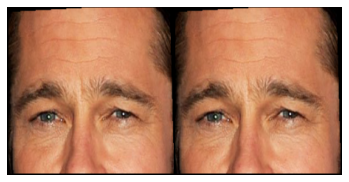

ours
tensor([1])
brad_pitt


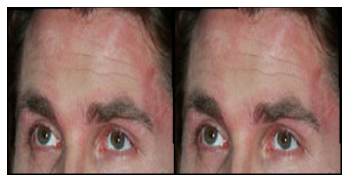

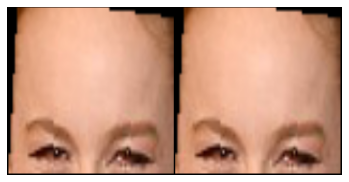

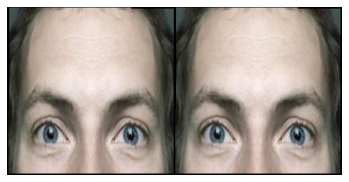

ours
tensor([13])
brittany snow
ours
tensor([13])
blake lively


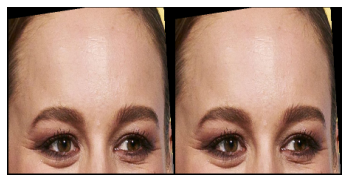

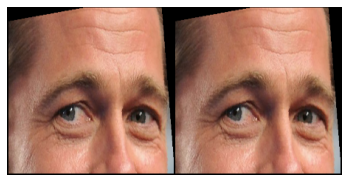

410.9973123073578


In [ ]:

# tester function to test mass image
total_checks= 20
#num_epoch=100
path = "./drive/MyDrive/best_half_face_256_1000.pth"
net = torch.load(path)

test_dataloader1 = DataLoader(siamese_dataset,num_workers=0,batch_size=1,shuffle=True)
dataiter1 = iter(test_dataloader1)

# function to resize image to vgg2 format
trans_vgg = transforms.Compose([transforms.Resize((224,224))])
tran1 = transforms.ToPILImage()
count_ours=0
count_ours1 = 0
class_match_ours=[]
class_match_vgg=[]
our_match_found = False
vgg_match_found = False
count_vgg = 0
thres_list=[]
label_list=[]
model_diss,vgg_diss,model_sim,vgg_sim = 0,0,0,0
label_list=[]
label_list_vgg=[]
name_list_vgg=[]
name_list=[]
class_match_o = 0
class_match_v = 0
start = time.time()
for i in range(120):
    class_match_o = 0
    class_match_v = 0
    img, img1 ,label= next(dataiter1)
    concatenated = torch.cat((img1,img1),0)
    imshow(torchvision.utils.make_grid(concatenated))
    #npimg = np.transpose(img1, (0,2, 3, 1))
    #samples = preprocess_input(npimg, version=2)
    #print(samples.shape)
    #yhat = model.predict(samples)
    ###### Ours Model ######
    #img0g = torchvision.transforms.ToTensor()(torchvision.transforms.Grayscale()(tran1(img0[0])))
    #img1g = torchvision.transforms.ToTensor()(torchvision.transforms.Grayscale()(tran1(img1[1])))
    #output1,output2 = net(img0.cuda(),img1.cuda())
    #output1,output2 = net(Variable(img0.cuda()),Variable(img1.cuda()))
    r =os.listdir('./imagebank')
    try:
      r.remove('.ipynb_checkpoints')
    except:
      pass  
    for i in r:
        k =os.listdir('./imagebank/' + i)
        matches_ours=0
        our_match_found = False
        vgg_match_found = False
        matches_vgg=0
        for m in k:
          img0 = Image.open('./imagebank/' + i+'/' +m)
          img0 = img0.resize((100,100))
          #img1 = img1.resize((100,100))
          img0 = img0.convert("L")
          #img1 = img1.convert("L")
          img0 = np.expand_dims(img0, axis=0)
          img0 = np.expand_dims(img0, axis=0)
          img0 = torch.from_numpy(img0).float()
          #print(img0.shape)
          output1 ,output2= net(Variable(img.cuda()),Variable(img0.cuda()))
          #print(output1.shape)
          #img0 = Image.open('./imagebank/' + i +'/' +m )
          #img0 =  transformss(img0)
          #img0 = torch.as_tensor(np.expand_dims(np.array(img0).astype('float'), axis=0)) 
          #img0 = np.transpose(img0, (0,2, 3, 1))
          #samples = preprocess_input(img0, version=2)
          #yhat1 = model.predict(samples)
          if(cosine((output1.cpu().detach().numpy()),(output2.cpu().detach().numpy()))< .1):
            matches_ours+=1  
          #print(cosine(yhat,yhat1))  
          #if(cosine(yhat,yhat1) < 0.5):
          #  matches_vgg+=1
          
          if(our_match_found == False and matches_ours >=10):
            our_match_found =True
            label_list.append(label)
            name_list.append(i)
            print("ours")
            print(label)
            print(i)
            break
          #if(vgg_match_found == False and matches_vgg >=10):
          #  vgg_match_found =True
          #  label_list_vgg.append(label)
          #  name_list_vgg.append(i)
          #if(our_match_found == True and vgg_match_found==True):
          #  break 
        if(our_match_found== True):
          class_match_o += 1
        #if(vgg_match_found == True):
        #  class_match_v +=1      
    class_match_ours.append(class_match_o)
    #class_match_vgg.append(class_match_v)
    


end = time.time()
print(end-start)


In [ ]:
p=0
g=0
for i in class_match_ours:
   if(i!=0):
     p+=1
     g+=i

In [ ]:
p=0
for i in class_match_ours:
   if(i==0):
     p+=1

In [ ]:
g/p


2.4361702127659575

In [ ]:
name_list

In [ ]:
count=0
dict ={'blake lively crop' : 0, 'brad_pitt_crop' :1, 'brendan gleeson crop' : 2,'brian cox crop' : 3, 'brie larson crop' : 4, 'britney spears crop' : 5,
       'brittany snow crop': 6, 'bruce lee crop' : 7, 'bruno mars crop' : 8, 'cameron diaz crop': 9, 
       'cate blanchett crop': 10, 'chadwick_boseman_crop' : 11, 'chris hemsworth crop': 12, 'chris martin crop' : 13, 'christian_bale_crop' :14,
       'emma roberts crop': 15, 'emma stone crop': 16, 'emma watson crop' : 17, 'eric bana crop': 18, 'ethan hawke crop' :19 }
for i in range(len(name_list)):
  h = label_list[i].item()
  if(dict[name_list[i]] == h):
    count +=1
  


In [ ]:
count

71

In [ ]:
count=0
dict ={'blake lively' : 0, 'brad_pitt' :1, 'brendan gleeson' : 2,'brian cox' : 3, 'brie larson' : 4, 'britney spears' : 5,
       'brittany snow': 6, 'bruce lee' : 7, 'bruno mars' : 8, 'cameron diaz': 9, 
       'cate blanchett': 10, 'chadwick_boseman' : 11, 'chris hemsworth': 12, 'chris martin' : 13, 'christian_bale' :14,
       'emma roberts': 15, 'emma stone': 16, 'emma watson' : 17, 'eric bana': 18, 'ethan hawke' :19 }
for i in range(len(name_list)):
  h = label_list[i].item()
  if(dict[name_list[i]] == h):
    count +=1
  


In [ ]:
count

11

In [ ]:
transform=transforms.Compose([ transforms.ToTensor(),])
r =os.listdir('./imagebank')
r.remove('.ipynb_checkpoints')
for i in r:
    img0 = Image.open('./imagebank/' + i)
    img0 = img0.resize((224,224))
    #img1 = img1.resize((100,100))
    #img0 = img0.convert("L")
    #img1 = img1.convert("L")
    #img0 = np.expand_dims(img0, axis=0)
    img0 = torch.as_tensor(np.expand_dims(np.array(img0).astype('float'), axis=0))
    print(img0.shape)
    samples = preprocess_input(img0, version=2)
    yhat = model.predict(samples)
    print(yhat.shape)
    #output1 ,c= net(Variable(img0.cuda()),Variable(img0.cuda()))
    #print(output1.shape)  

torch.Size([1, 224, 224, 3])
(1, 2048)
torch.Size([1, 224, 224, 3])
(1, 2048)


In [ ]:
def kvalidation(test_dataloader1,dataiter1,total_checks):
    
    model_diss,vgg_diss,model_sim,vgg_sim = 0,0,0,0
    # tester function to test mass image

    for i, data in enumerate(test_dataloader1,0):
    
        img0, img1 , img2, label, dissim = data
        output1 = net(Variable(img0.cuda()))
        r =os.listdir('./imagebank_half')
        r.remove('.ipynb_checkpoints')
        for i in r:
            img0 = Image.open('./imagebank_half/' + i)
            img0 = img0.resize((100,100))
            #img1 = img1.resize((100,100))
            img0 = img0.convert("L")
            #img1 = img1.convert("L")
            img0 = np.expand_dims(img0, axis=0)
            img0 = np.expand_dims(img0, axis=0)
            img0 = torch.from_numpy(img0).float()
            print(img0.shape)
            output1 ,c= net(Variable(img0.cuda()),Variable(img0.cuda()))
            print(output1.shape)
            img0v = img0.resize((224,224))
            #img1 = img1.resize((100,100))
            img0v = torch.as_tensor(np.expand_dims(np.array(img0v).astype('float'), axis=0))
            samples = preprocess_input(img0v, version=2)
            yhat = model.predict(samples)
            print(yhat.shape)

    
        # getting image vector from vgg2
        npimg = np.transpose(trans_vgg(img2), (0,2, 3, 1))
        npimg1 = np.transpose(trans_vgg(img3), (0,2, 3, 1))    
        samples = preprocess_input(npimg, version=2);samples1 = preprocess_input(npimg1, version=2)
        yhat = model.predict(samples); yhat1 = model.predict(samples1)
        #print(label.shape[0])
     
        for i in range(label.shape[0]):
            if(label[i]==1):
                if(cosine(yhat[i],yhat1[i]) < cosine(output1[i].cpu().detach().numpy(),output2[i].cpu().detach().numpy())):
                    model_diss+=1
                else:
                    vgg_diss+=1
            if(label[i]==0):
                if(cosine(yhat[i],yhat1[i]) > cosine(output1[i].cpu().detach().numpy(),output2[i].cpu().detach().numpy())):
                    model_sim+=1
                else:
                    vgg_sim+=1
     
        #print("model better than vgg for dissimilar images {}".format(model_diss))
        #print("model worse than vgg for dissimilar images {}".format(vgg_diss))
        #print("model better than vgg for similar images {}".format(model_sim))
        #print("model worse than vgg for similar images {}".format(vgg_sim))
    
        break
    
    our_acc=(model_diss+model_sim) / total_checks
    vgg_acc=(vgg_diss+vgg_sim) / total_checks
    
    return our_acc, vgg_acc

##################################### Start validation ########################################
k=10
total_checks= 50
test_dataloader1 = DataLoader(siamese_dataset,num_workers=0,batch_size=total_checks,shuffle=True)
dataiter1 = iter(test_dataloader1)

ours = []
vgg = []
for i in range(k):
    x,y = kvalidation(test_dataloader1,dataiter1,total_checks)
    ours.append(x)
    vgg.append(y)
    
print("Ours Accurcy (%): {:.4f}, Std.: {:.4f}".format(np.mean(ours),np.std(ours)))
print("VGGFace2 Accurcy (%): {:.4f}, Std.: {:.4f}".format(np.mean(vgg),np.std(vgg)))

ValueError: ignored

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
!pip install colored

     |████████████████████████████████| 61kB 5.5MB/s 
  Created wheel for colored: filename=colored-1.4.2-cp36-none-any.whl size=14004 sha256=0667a21dd2e2fa42c95748fab693a3d77eafa2eee763160de874925ebc94531f
  Stored in directory: /root/.cache/pip/wheels/ec/10/5e/d17d5ef644e1051a753bd98f3796789ec39bc3337cd36637f3
Successfully built colored


In [ ]:
from colored import fg, bg, attr

print ('%s%s Hello World !!! %s' % (fg('orchid'), attr('bold'), attr('reset')))
print ('%s%s Hello World !!! %s %s' % (fg(9), attr('bold'), str(20.5), attr(0)))

In [ ]:
if 5<np.Inf:
    print("%s" % (str(np.Inf)))

In [ ]:
!unzip './imagebank.zip' -d './'


In [ ]:
!rm -rf './imagebank_half'